# Intro timeseries

## A. Init

1.   Install required packages
2.   Functions



### A.1 Install required packages

In [1]:
!pip install prophet pmdarima > /dev/null 2>&1

In [2]:
import os
import datetime
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from dateutil.relativedelta import relativedelta

from prophet import Prophet
from prophet.plot import add_changepoints_to_plot
from prophet.plot import plot_plotly, plot_components_plotly
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import pacf, acf

from IPython.display import display, HTML

### A.2 Functions

In [3]:
# split data frame in validate and train set, based on input date
def split_train_validate(df, date_column="date", hist_end=pd.Timestamp("2015-12")):
    df['train_data'] = np.where(df[date_column] <= hist_end, 1, 0)
    df_validate = df[df['train_data'] == 0]
    df_train = df[df['train_data'] == 1]
    return df_train, df_validate, df

def produce_metrics(pd_pred: pd.DataFrame, y='y', res='res'):
    """
    Calculates a number of metrics given data with residuals and actual values.
    :param pd_pred: pandas Dataframe with at least residuals and actual values.
    :return: a tuple of metrics
    """

    e = (pd_pred.loc[:, res]).dropna()
    value = pd_pred.loc[:, y].dropna()
    se = np.square(e)
    ae = np.abs(e)

    bias = np.mean(e)
    rmse = np.sqrt(np.mean(se))
    mae = np.mean(ae)
    mean_value = np.mean(value)
    mae_perc = mae/mean_value*100
    rmse_perc = rmse/mean_value*100

    return {"mean_value": mean_value, "bias": bias, "rmse": rmse, 
            "rmse_perc": rmse_perc, "mae": mae, "mae_perc": mae_perc}

def plot_residuals(pd_res: pd.DataFrame) -> go.Figure:
    """
    Create summary residual plot of all predictions
    """

    pd_res = pd_res.sort_values(['date'])
    ae = np.abs((pd_res.loc[:, 'res']).dropna())
    datetime_validation = min(pd_res[pd_res.train_data == 0]['date'])

    fig = make_subplots(rows=2, cols=1)

    fig.add_trace(
        go.Scattergl(x=pd_res['date'], y=pd_res['res'], mode='markers'),
        row=1, col=1
    )
    fig.add_shape(type='line',
                  x0=datetime_validation,
                  y0=min(pd_res['res']),
                  x1=datetime_validation,
                  y1=max(pd_res['res']),
                  line=dict(color='White', ),
                  col=1,
                  row=1
                  )
    fig.add_trace(
        go.Scattergl(x=pd_res['yhat'], y=pd_res['res'], mode='markers'),
        row=2, col=1
    )
    fig.add_shape(type='line',
                  x0=datetime_validation,
                  y0=min(pd_res['res']),
                  x1=datetime_validation,
                  y1=max(pd_res['res']),
                  line=dict(color='White', ),
                  col=1,
                  row=1
                  )
    fig.update_yaxes(title='RESIDUAL (ACTUAL - PREDICTED)', col=1, row=1)
    fig.update_yaxes(title='RESIDUAL (ACTUAL - PREDICTED)', col=1, row=2)
    fig.update_xaxes(title='TIME', col=1, row=1)
    fig.update_xaxes(title='TEMPERATURE ANOMALY', col=1, row=2)

    fig.update_layout(template="plotly_dark", height=800, showlegend=False)

    return fig

## B - Case Fietstellingen



### B.1 Load data
This is open data about counting bikes on "fietsostrades", i.e. cycling highways in flanders.

Data has 15 minute intervals, but here we aggregate to hourly intervals, as this is sufficient for the case.

https://opendata.apps.mow.vlaanderen.be/fietstellingen/index.html

In [4]:
base_url = "https://opendata.apps.mow.vlaanderen.be/fietstellingen/"

os.system("mkdir -p data_gent/")
start = pd.Timestamp("2019-08")
stop = datetime.datetime.now()
paths = list()

month = start
while month < stop:

    fname = "data-" + month.strftime("%Y-%m") + ".csv"
    url = base_url + fname
    outname = "data_gent/" + fname
    os.system("wget -O " + outname + " " + url)
    paths.append(outname)

    #print(fname)
    month += relativedelta(months=1)

# read data
df_cycle = pd.concat([
    pd.read_csv(
        path,
        sep=",",
        names=[
            "site",
            "direction",
            "type",
            "start_time",
            "stop_time",
            "count"
        ]
    )
    for path in paths
])

# show data
df_cycle.head(4)

,site,direction,type,start_time,stop_time,count
0,1,IN,FIETSERS,2019-08-01 00:00:00.0,2019-08-01 00:15:00.0,0.0
1,1,IN,FIETSERS,2019-08-01 00:15:00.0,2019-08-01 00:30:00.0,0.0
2,1,IN,FIETSERS,2019-08-01 00:30:00.0,2019-08-01 00:45:00.0,0.0
3,1,IN,FIETSERS,2019-08-01 00:45:00.0,2019-08-01 01:00:00.0,0.0


### B.2 Prepare data

- parse date column to a pandas datetime type
- aggregate to have hourly "tellingen"
- add some month / year columns

In [5]:
# filter on Fieters - rename start_time to date
df_cycle = (
    df_cycle[df_cycle["type"] == "FIETSERS"]
    .rename(columns={"start_time": "date"})
)

# parse date, floor at hour and aggregate (just take sum of all "Fietsers")
df_cycle["date"] = pd.to_datetime(df_cycle["date"])
df_cycle["date"] = df_cycle["date"].dt.floor("h")
df_cycle = (
    df_cycle
    .groupby("date")
    .agg({"count": "sum"})
    .reset_index()
)
df_cycle["month_name"] = df_cycle["date"].dt.strftime("%b")
df_cycle["day_name"] = df_cycle["date"].dt.strftime("%A")

display(df_cycle.head(10))
display(df_cycle.agg({"date": ["min", "max", "count"]}))

,date,count,month_name,day_name
0,2019-08-01 00:00:00,51.0,Aug,Thursday
1,2019-08-01 01:00:00,25.0,Aug,Thursday
2,2019-08-01 02:00:00,26.0,Aug,Thursday
3,2019-08-01 03:00:00,19.0,Aug,Thursday
4,2019-08-01 04:00:00,38.0,Aug,Thursday
5,2019-08-01 05:00:00,96.0,Aug,Thursday
6,2019-08-01 06:00:00,311.0,Aug,Thursday
7,2019-08-01 07:00:00,627.0,Aug,Thursday
8,2019-08-01 08:00:00,596.0,Aug,Thursday
9,2019-08-01 09:00:00,468.0,Aug,Thursday


,date
min,2019-08-01 00:00:00
max,2021-11-09 03:00:00
count,19946


### B.3 Explore by visualization

The first thing to do (in any data analysis task) is to plot the data. Graphs enable many features of the data to be visualised, including patterns, unusual observations, changes over time, and relationships between variables.

Some important questions to consider when first looking at a time series are:

- Trend? Do measurements tend to increase (or decrease) over time?
- Seasonality? Is there a regularly repeating pattern related to calendar time?
- Cycle? Is there a long-run cycle or period unrelated to seasonality factors?
- Outliers? Are there points far away from other data?
- Variance? Constant over time or non-constant?
- Abrupt changes?

#### Trend & outliers

##### Line plot
! Make sure to check the daily / weekly pattern

In [ ]:
fig = px.line(
    df_cycle,
    x="date",
    y="count",
    title='Number of cyclists (count))',
)
fig.update_xaxes(title='Time')
fig.update_yaxes(title='Count')
fig.update_layout(template="plotly_dark", height=400, showlegend=True)
fig.show()


fig = px.scatter(
    df_cycle,
    x="date",
    y="count",
    title='Number of cyclists (count))',
)
fig.update_xaxes(title='Time')
fig.update_yaxes(title='Count')
fig.update_layout(template="plotly_dark", height=400, showlegend=True)
fig.show()

##### Bar plot
- Too many bars to plot by hour
- Aggregate
  - at daily level
  - at weekly level - to explore seasonal effects


In [28]:
#daily total
df_cycle["day"] = df_cycle.date.dt.date
df_cycle["week"] = df_cycle.date.dt.isocalendar().week
df_cycle["year"] = df_cycle.date.dt.isocalendar().year
df_cycle["dayofweek"] = df_cycle.date.dt.dayofweek
df_cycle_daily = df_cycle[['day', 'count', 'year', 'week', 'dayofweek']].groupby(['day', 'year', 'week', 'dayofweek']).agg('sum').reset_index()

fig = px.bar(
    df_cycle_daily,
    x="day",
    y="count",
    color='count',
    color_continuous_scale=px.colors.sequential.RdBu_r,
    title='Total number of cyclists by day',
)
fig.update_xaxes(title='date')
fig.update_yaxes(title='count')
fig.update_layout(template="plotly_dark", width=1000, showlegend=True)
fig.show()


fig = px.line(
    df_cycle_daily[(df_cycle_daily.year == 2021)&(df_cycle_daily.week >=20)],
    x="dayofweek",
    y="count",
    color='week',
    title='Total number of cyclists by day of the week',
)
fig.update_xaxes(title='date')
fig.update_yaxes(title='count')
fig.update_layout(template="plotly_dark", width=1000, showlegend=True)
fig.show()

In [9]:
#daily average by week
df_cycle["week_by_year"] = df_cycle["year"].astype(str) +  df_cycle["week"].astype(str).str.zfill(2)
df_cycle_weekly = df_cycle[['day', 'year', 'week', 'week_by_year', 'count']]\
                            .groupby(['day', 'year', 'week', 'week_by_year']).agg('sum').reset_index()\
                            .groupby(['week_by_year', 'week', 'year']).agg('mean').reset_index()

fig = px.bar(
    df_cycle_weekly,
    x="week_by_year",
    y="count",
    color='count',
    color_continuous_scale=px.colors.sequential.RdBu_r,
    title='Average daily cyclists by week',
)
# force x-axis to have categories
fig.update_layout(xaxis_type='category')
fig.update_xaxes(title='week of the year')
fig.update_yaxes(title='count')
fig.update_layout(template="plotly_dark", width=1000, showlegend=True)
fig.show()

fig = px.line(
    df_cycle_weekly.sort_values('week'),
    x="week",
    y="count",
    color='year',
    title='Average daily cyclists by week',
)
# force x-axis to have categories
fig.update_layout(xaxis_type='category')
fig.update_xaxes(title='week of the year')
fig.update_yaxes(title='count')
fig.update_layout(template="plotly_dark", width=1000, showlegend=True)
fig.show()

##### Conclusion
- No visible trend
- A yearly seasonal pattern
- A weekly seasonal pattern is less clear - other visuals required to clearly distinguish them

#### Seasonalities & cycle period

##### Seasonality plot

In [ ]:
df_cycle_weekly["week"] = "w" + df_cycle_weekly['week'].astype(str)
fig = px.line_polar(
    df_cycle_weekly.sort_values('week_by_year'),
    r="count",
    theta="week",
    color="year",
    color_discrete_sequence=px.colors.sequential.Plasma_r,
    line_close=False,
    title='Average daily number of cyclists by week'
)
fig.update_layout(template="plotly_dark", height=600, width=800, showlegend=True)
fig.show()

##### Lag plot
Plot the values against the values k-shifts back. It can show if there is any and the nature of the correlation with the previous values.

In [ ]:
def lag_plot(ts, lag):
  fig = go.Scattergl(
    x=ts[:-lag],
    y=ts[lag:],
    mode='markers'
  )
  return fig

Lags = [1,2,3,25,26,27,49,50,51]

fig = make_subplots(rows=3, cols=3, 
                    subplot_titles=[f'Lag {i}' for i in Lags])

for i in range(1, len(Lags)+1):
  row_num = 1+int((i-1)/3)
  col_num = (2+i)%3 + 1
  fig.add_trace(lag_plot(ts=df_cycle['count'], lag=Lags[i-1]),
      row=row_num, col=col_num
  )
  fig.update_xaxes(title_text=f'Value', row=row_num, col=col_num)
  fig.update_yaxes(title_text=f'Value lag {i}', row=row_num, col=col_num)

fig.update_layout(template="plotly_dark", height=1200, showlegend=False)
fig.show()

##### (Partial) Autocorrelation
- The **autocorrelation at lag k** is the correlation between the observations in a timeseries and the observations in the same timeseries shifted k lags
- The autocorrelation plot shows those autocorrelation for a number of lags
- The **partial autocorrelation** at lag k is the correlation that results after removing the effect of any correlations due to the terms at shorter lags.
- A partial autocorrelation plot is a summary of the relationship between an observation in a time series with observations at prior time steps with the relationships of intervening observations removed.
- Mostly, if there are seasonalities, they are visible in the autocorrelation plots


In [ ]:
df_acf = acf(df_cycle["count"], nlags=12*24)
fig = go.Figure()
fig.add_trace(go.Scatter(
    x= np.arange(len(df_acf)),
    y= df_acf,
    name= 'Autocorrelation',
    ))

df_pacf = pacf(df_cycle["count"], nlags=12*24)
fig.add_trace(go.Scatter(
    x= np.arange(len(df_pacf)),
    y= df_pacf,
    name= 'Partial autocorrelation',
    ))
fig.update_xaxes(title='Lag')
fig.update_yaxes(title='Correlation')
fig.update_layout(template="plotly_dark", height=400, showlegend=True, title='(Partial) Autocorrelation')
fig.show()

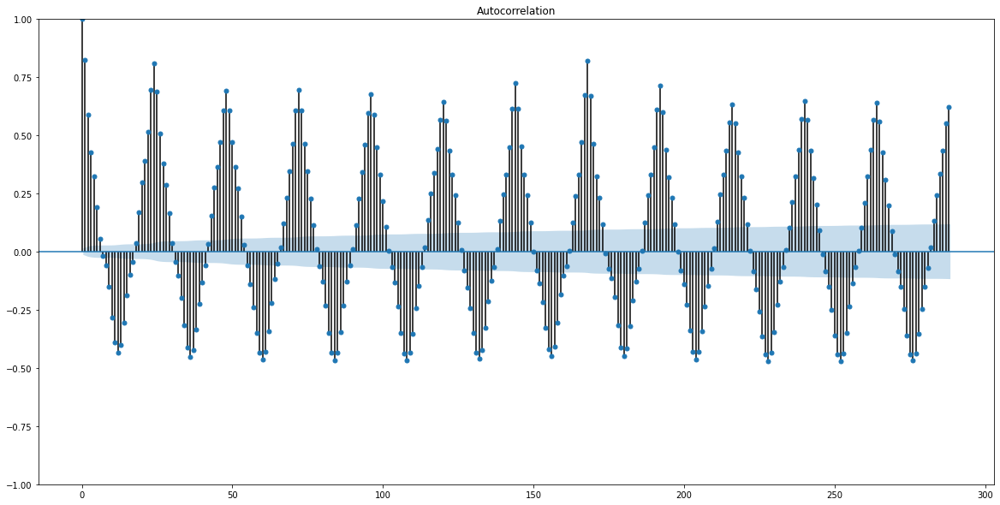

In [ ]:
# Autocorrelation and partial autocorrelation with confidence interval
# Every value outside those boundaries is considered as a correlation significantly different from 0
fig, axs = plt.subplots(1, 1, figsize=(20,10))
plot_acf(df_cycle["count"], lags=12*24, ax=axs);

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



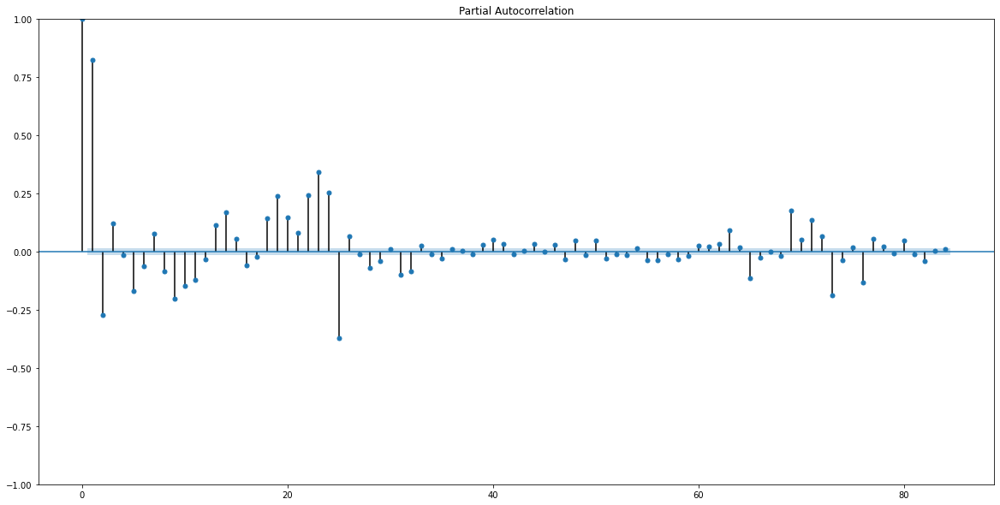

In [ ]:
# Autocorrelation and partial autocorrelation with confidence interval
# Every value outside those boundaries is considered as a correlation significantly different from 0
fig, axs = plt.subplots(1, 1, figsize=(20,10))
plot_pacf(df_cycle["count"], lags=12*7, ax=axs);

##### Conclusions
- The seasonality plot shows a year seasonality
- The lag plots shows merely a correlation with the first lag
- The (partial)autocorrelation plots, show
    - a daily pattern
    - a ? weekly pattern


### B.4 Forecasting

#### Split into train and validaton data
Generally, a dataset is split into a train, validate and test set. The train and validate sets are used to train the different models and validate the results of the trained models to choose the best performing model. The test set is then used at the end to give the final performance measure of the choosen model.
Here, as this is only an introduction, we will work with a train and validation data set.
Specifically:
- Everything before sept 2021 is train data. This is data that we will use to train our forcasting model
- Everything starting from sept 2021 is validation data. We will use this part to validate our performance.

! The data consists of counts.
- Often to obtain a "better" fit, a transformation is required to create a constant variance / to have values more adapted to the normal distribution e.g take logarithm / sqrt / other power transformation
- The model takes not into account that a negative value is not possible, this should be incorporated afterwards

! Forecasting timeseries requires regular retraining (to incorporate a new trend, ...).

In [29]:
df_train, df_validate, df_data = split_train_validate(df_cycle, date_column="date", hist_end=pd.Timestamp("2021-09"))
# show the timewindows in the data
display(df_data.agg({"date": ["min", "max", "count"]}) )
display(df_train.agg({"date": ["min", "max", "count"]}) )
display(df_validate.agg({"date": ["min", "max", "count"]}))

,date
min,2019-08-01 00:00:00
max,2021-11-09 03:00:00
count,19946


,date
min,2019-08-01 00:00:00
max,2021-09-01 00:00:00
count,18287


,date
min,2021-09-01 01:00:00
max,2021-11-09 03:00:00
count,1659


#### Forecast with prophet

- For this forecast we will use a prophet model. Prophet is a python framework to do forecasts, developped by facebook. You can read more about it here: https://facebook.github.io/prophet/
- Prophet tries to find a long term trend and then some seasonal components. Since we have montly data, we can only have seasonalities based on monthly periods (e.g. half a year, year, ...)
- Prophet requires at least the following two variables in the dataframe
  - ds: timestamp
  - y: the observations

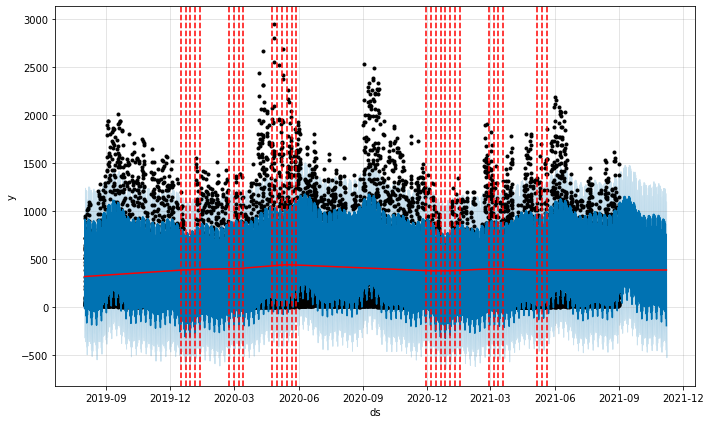

In [ ]:
df_train_prophet = df_train.rename(columns={"date": "ds", "count":"y"})
df_data_prophet = df_data.rename(columns={"date": "ds", "count":"y"})

params_changepoints = {"n_changepoints": 100, "changepoint_range": 0.9,"changepoint_prior_scale": 0.05}
# n_changepoints: maximum number of possible changepoints for the global trend (model determines how many will be used)
# changepoint_range = % of the datarange where changepoints can be situated
# changepoint_prior_scale: regularization parameter against overfitting, the smaller the less flexible (less changes)

#params_yearly = {"period": 365.25, "fourier_order": 12, "prior_scale": 0.5}
                                
# specify prophet model
model = Prophet(
    **params_changepoints,
    interval_width=0.8, #confidence interval width
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=True,
    #seasonality_mode='multiplicative', # change seasonality with trend
    )
# train the model
model.fit(df_train_prophet)

# make future predictions
forecast = model.predict(df_data_prophet)

# plot predictions
fig = plot_plotly(model, forecast)
fig.show()

fig = plot_components_plotly(model, forecast)
fig.show()

from fbprophet.plot import add_changepoints_to_plot
fig = model.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), model, forecast)
display()

#### Validate forecast

- Compare modelbehavior / residuals / metrics between the train data and validation data. 
- Calculate the error of the forecast, which we will average later on. This will show us whether we have bias (like tendancy to over or underestimate)
- Because we have positive and negative errors, it makes sense to also look at the absolute error, which tells you more about how good you can fit the variation over months or cases.

- Both metrics also have a percentual version, where you compare with the actual value to have an indication about how "big" the error is. We will caculate this one on the averaged version to overcome small value problems at record level.

In [ ]:
# join data
df_forecast = pd.merge(
    df_data,
    forecast[["ds", "yhat"]].rename(columns={"ds": "date"}),
    left_on="date",
    right_on="date"
)

# calculate residuals and metrics
df_forecast['res'] = df_forecast['count'] - df_forecast['yhat']
produce_metrics(df_forecast[df_forecast.train_data==1], y='count', res='res')
produce_metrics(df_forecast[df_forecast.train_data==0], y='count', res='res')
pd_results = pd.DataFrame.from_dict(produce_metrics(df_forecast[df_forecast.train_data==1], y='count', res='res'), 
                       orient='index', columns=['Train'])
pd_results['Validate'] = pd.DataFrame.from_dict(produce_metrics(df_forecast[df_forecast.train_data==0], y='count', res='res'), 
                         orient='index', columns=['Validate'])['Validate']
# show results
pd_results

,Train,Validate
mean_value,392.899601,529.921788
bias,1.537031,167.153778
rmse,244.403343,418.220066
rmse_perc,62.205037,78.921093
mae,160.497103,240.079818
mae_perc,40.849393,45.304764


In [ ]:
plot_residuals(df_forecast).show()

#### Conclusions
- You can easily obtain the most important seasonal patterns from a prophet model
  - If you look at these components you clearly see a morning and evening spike of traffic. You also see that weekdays are more popular.
  - Residuals show some patterns left, a non constant variance
  - There are some outliers
- However, this is not a very good model yet, to improve
  - (school)holidays data should be added
  - other seasonalities can be tried
  - probably there will be some covid effect
  - the increasing variance should be solved by transforming the counts
  - negative forecasts are not possible
  - ...

## Try it yourself


In [ ]:
# https://machinelearningmastery.com/time-series-datasets-for-machine-learning/
# https://raw.githubusercontent.com/jbrownlee/Datasets/master/shampoo.csv #shampoo sales
# https://raw.githubusercontent.com/jbrownlee/Datasets/master/daily-min-temperatures.csv #minimal temperature for each day in australia
# https://raw.githubusercontent.com/jbrownlee/Datasets/master/monthly-sunspots.csv #sun spots
# https://raw.githubusercontent.com/jbrownlee/Datasets/master/daily-total-female-births.csv female births
# any other dataset you can find!